In [10]:
!pip install contextily
!pip install geopandas
!pip install shapely

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 30.2 MB/s eta 0:00:00


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import contextily as ctx
from matplotlib.colors import LinearSegmentedColormap
import geopandas as gpd
from shapely.geometry import Point
import os
from datetime import datetime

In [12]:
file_paths = {
    2020: '311_2020.csv',
    2021: '311_2021.csv',
    2022: '311_2022.csv',
    2023: '311_2023.csv',
    2024: '311_2024.csv'
}

In [3]:
yearly_results = {}
total_animal_reports = 0
all_animal_complaints = pd.DataFrame()


Analyzing data for 2020...


<ipython-input-14-227eeade69a8>:6: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


Successfully loaded 311_2020.csv with 251222 records
Animal complaints in 2020: 3239
Top 5 most common animal complaints in 2020:
case_title
Animal Generic Request       2565
Animal Found                  301
Animal Lost                   229
Animal Noise Disturbances     144
Name: count, dtype: int64

Analyzing data for 2021...


<ipython-input-14-227eeade69a8>:6: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


Successfully loaded 311_2021.csv with 273784 records
Animal complaints in 2021: 4106
Top 5 most common animal complaints in 2021:
case_title
Animal Generic Request       3390
Animal Found                  335
Animal Lost                   230
Animal Noise Disturbances     151
Name: count, dtype: int64

Analyzing data for 2022...


<ipython-input-14-227eeade69a8>:6: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


Successfully loaded 311_2022.csv with 276599 records
Animal complaints in 2022: 4031
Top 5 most common animal complaints in 2022:
case_title
Animal Generic Request                     3340
Animal Found                                309
Animal Lost                                 257
Animal Noise Disturbances                   124
Ground Maintenance: Chester Park - BPRD       1
Name: count, dtype: int64

Analyzing data for 2023...


<ipython-input-14-227eeade69a8>:6: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


Successfully loaded 311_2023.csv with 266438 records
Animal complaints in 2023: 4151
Top 5 most common animal complaints in 2023:
case_title
Animal Generic Request       3397
Animal Found                  337
Animal Lost                   291
Animal Noise Disturbances     122
Pick up Dead Animal             4
Name: count, dtype: int64

Analyzing data for 2024...
Successfully loaded 311_2024.csv with 282836 records
Animal complaints in 2024: 4174
Top 5 most common animal complaints in 2024:
case_title
Animal Generic Request                        3498
Animal Found                                   297
Animal Lost                                    278
Animal Noise Disturbances                       99
Ground Maintenance: Savin Hill Park - BPRD       1
Name: count, dtype: int64

--- OVERALL ANALYSIS (2020-2024) ---
Total Animal Reports: 98505
Overall trend: increasing (191.50 complaints per year)

Top 10 Most Common Animal Complaints (2020-2024):
case_title
Animal Generic Request        

<ipython-input-14-227eeade69a8>:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))



Peak month for animal complaints: August


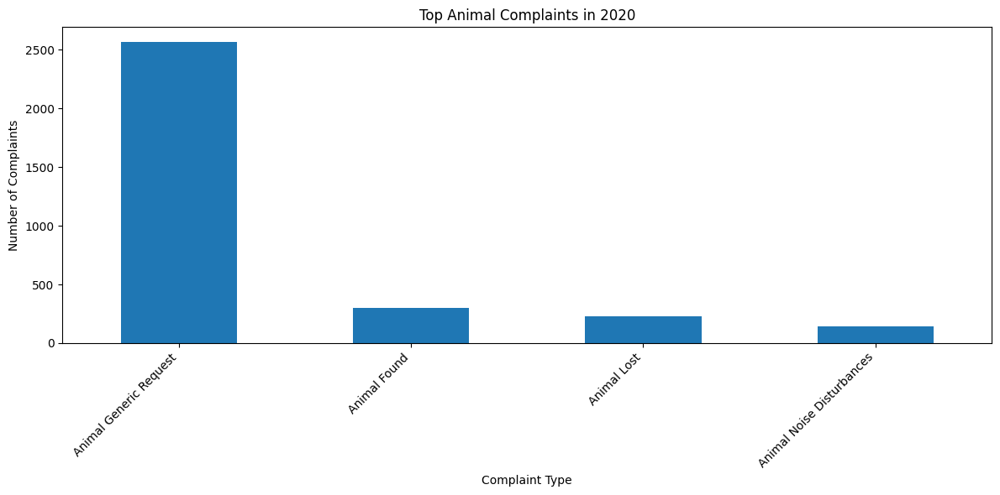

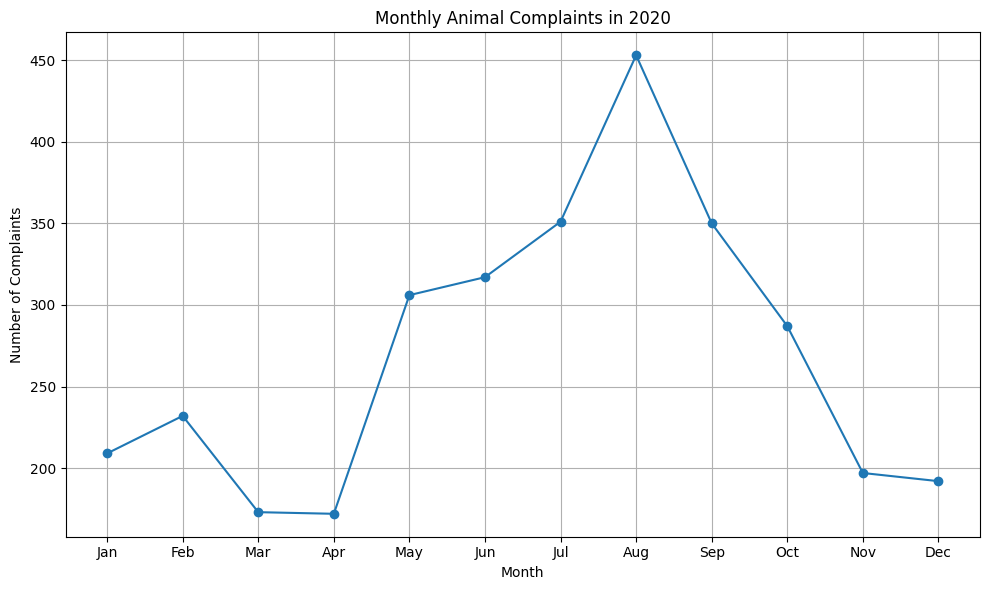

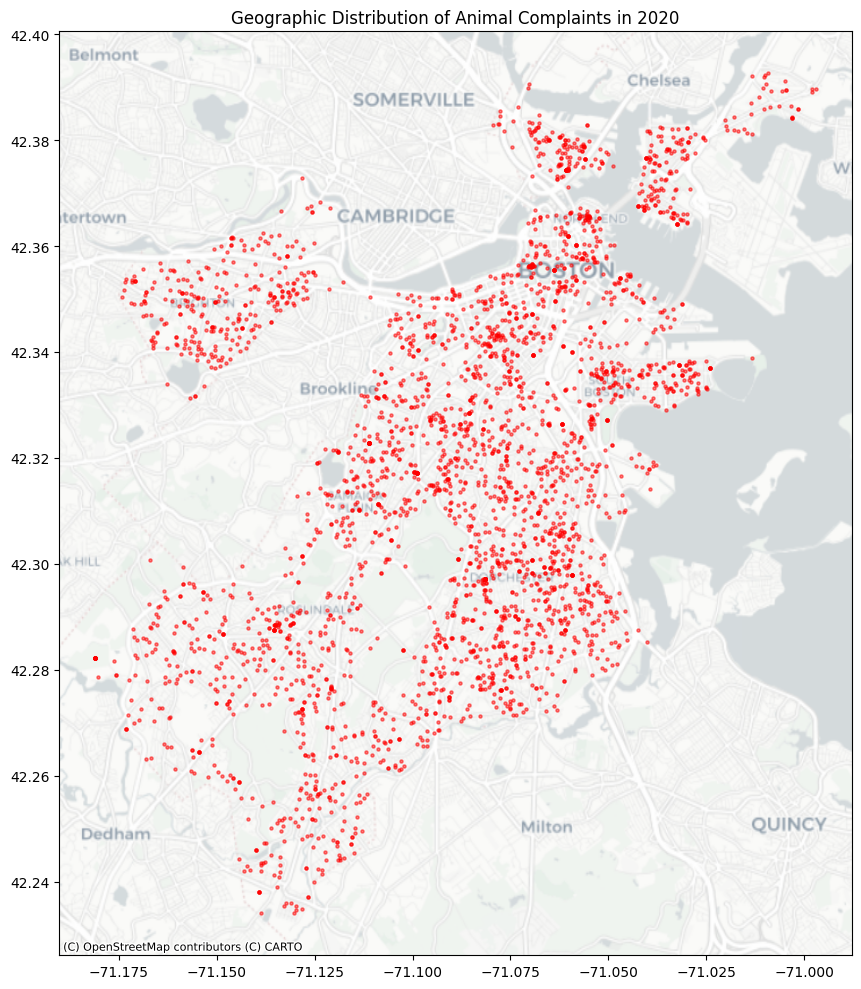

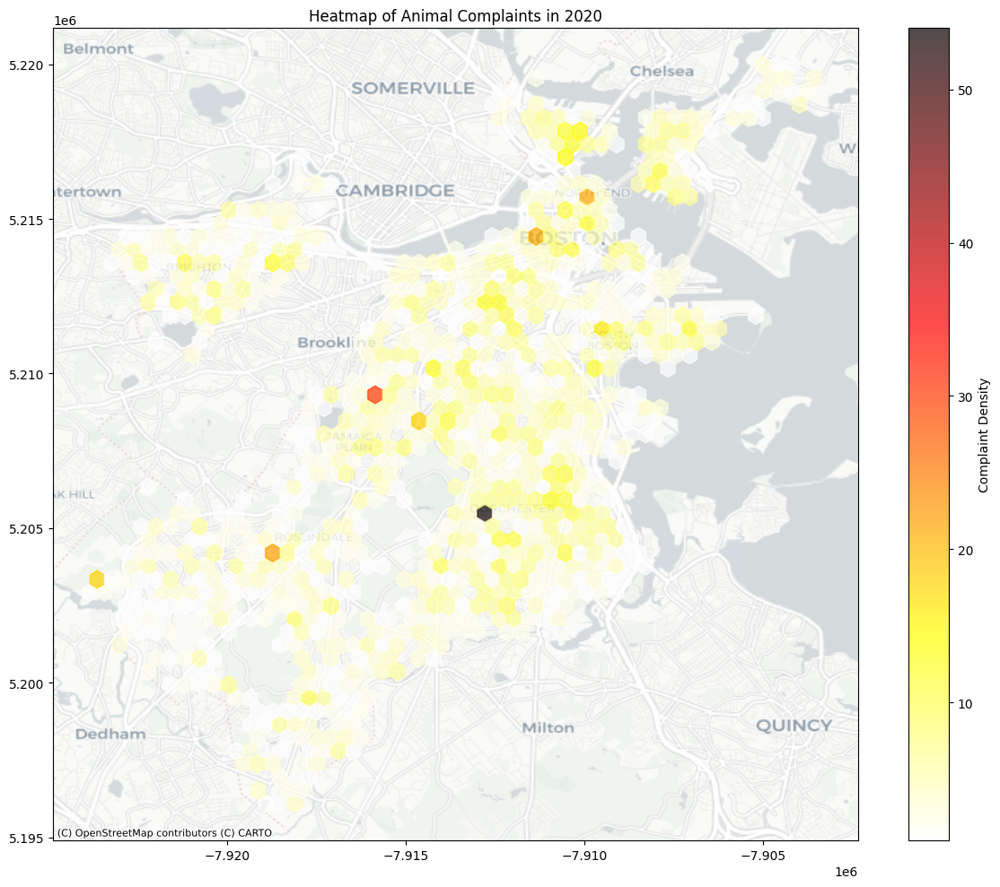

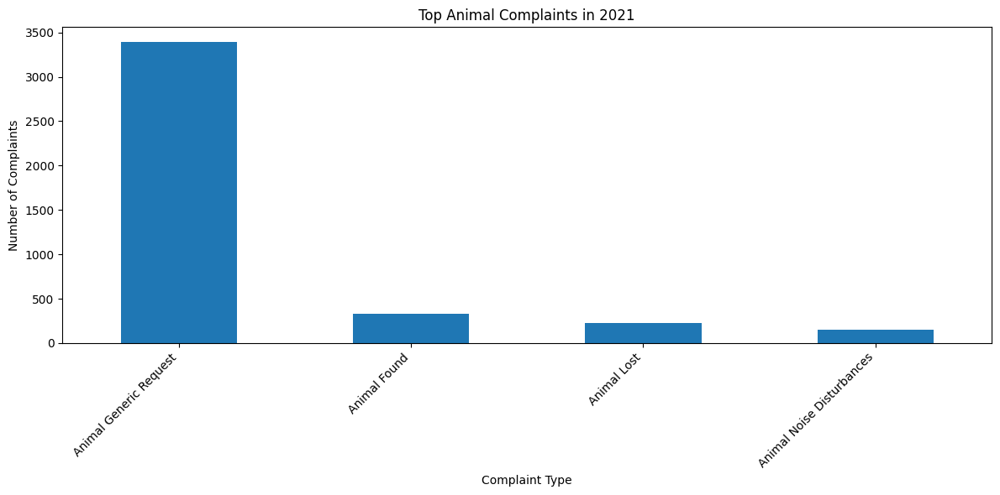

...

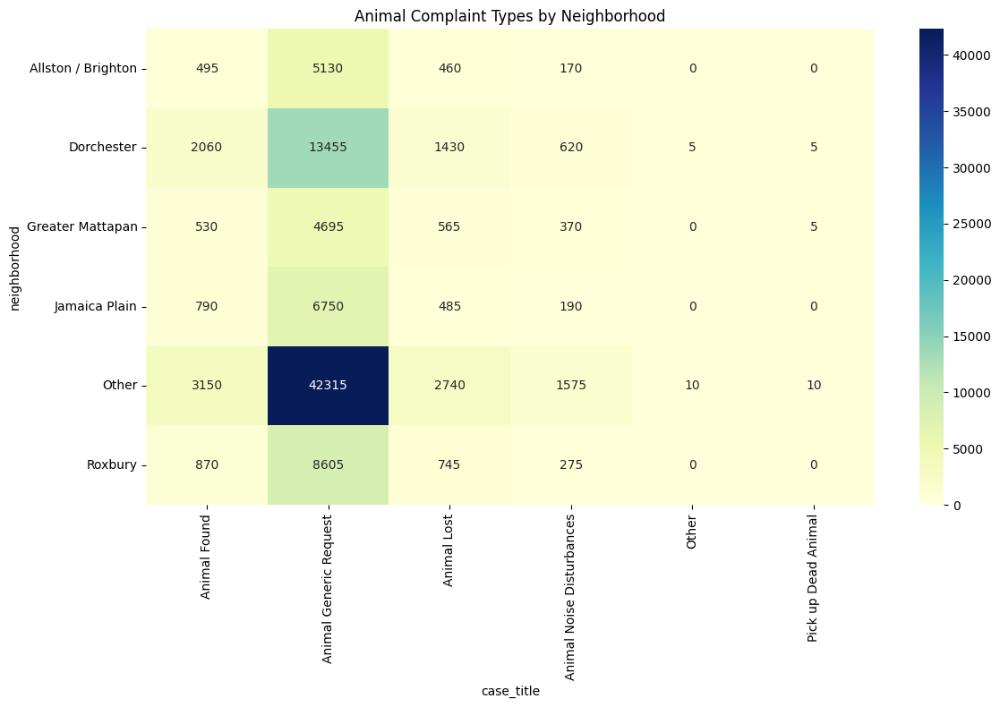

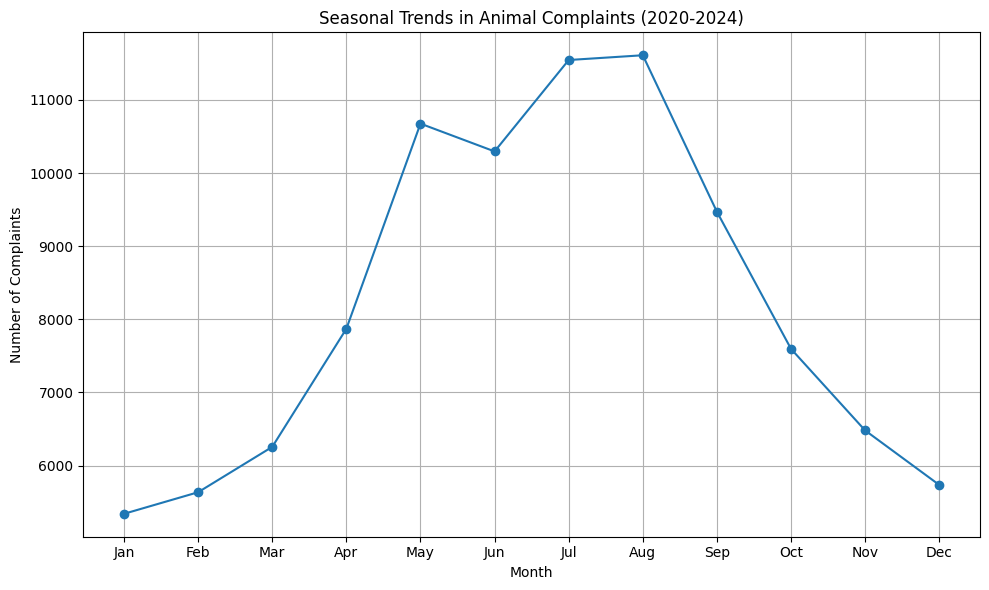

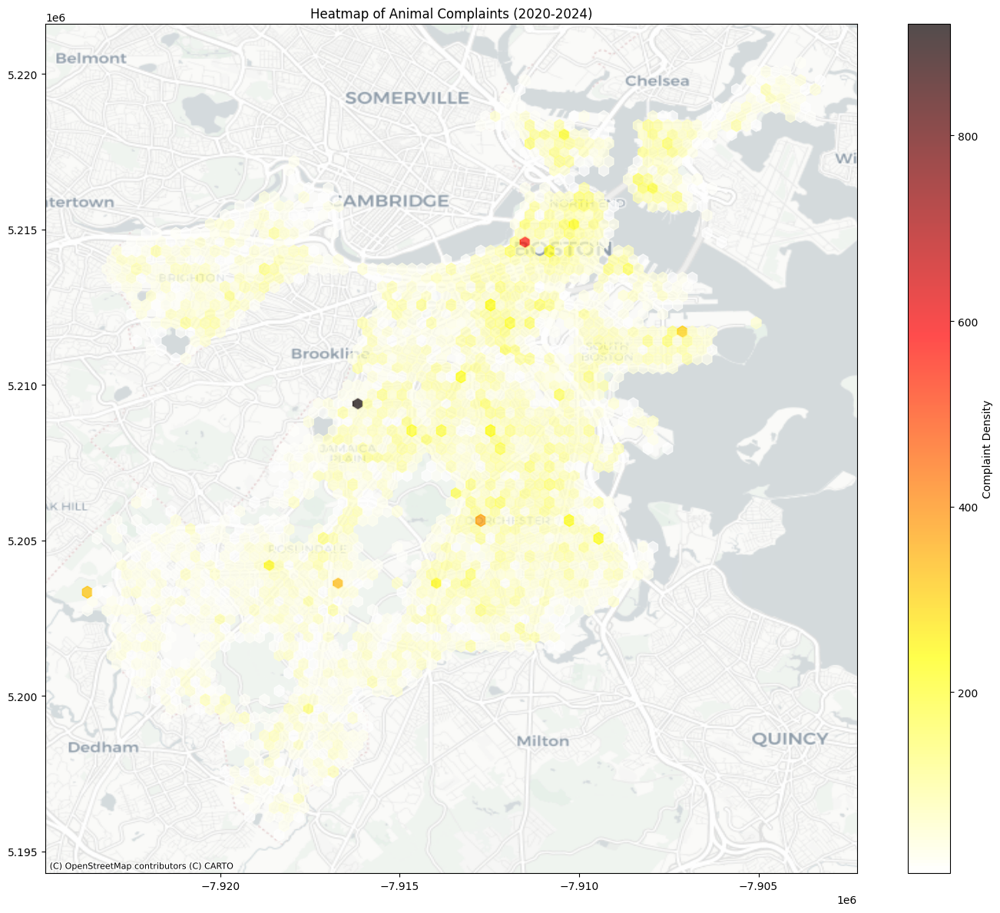

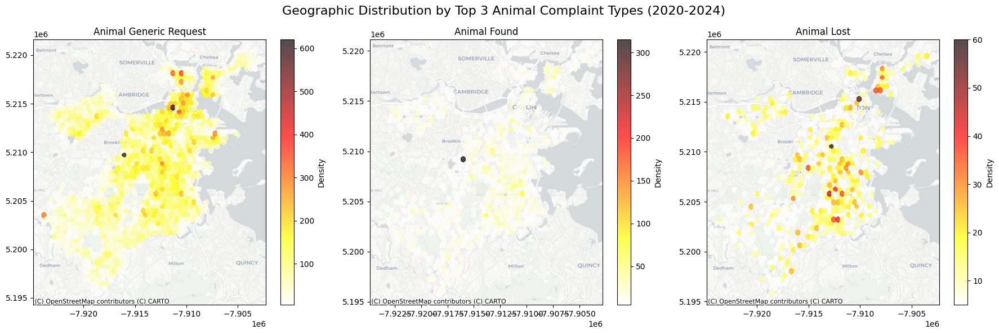

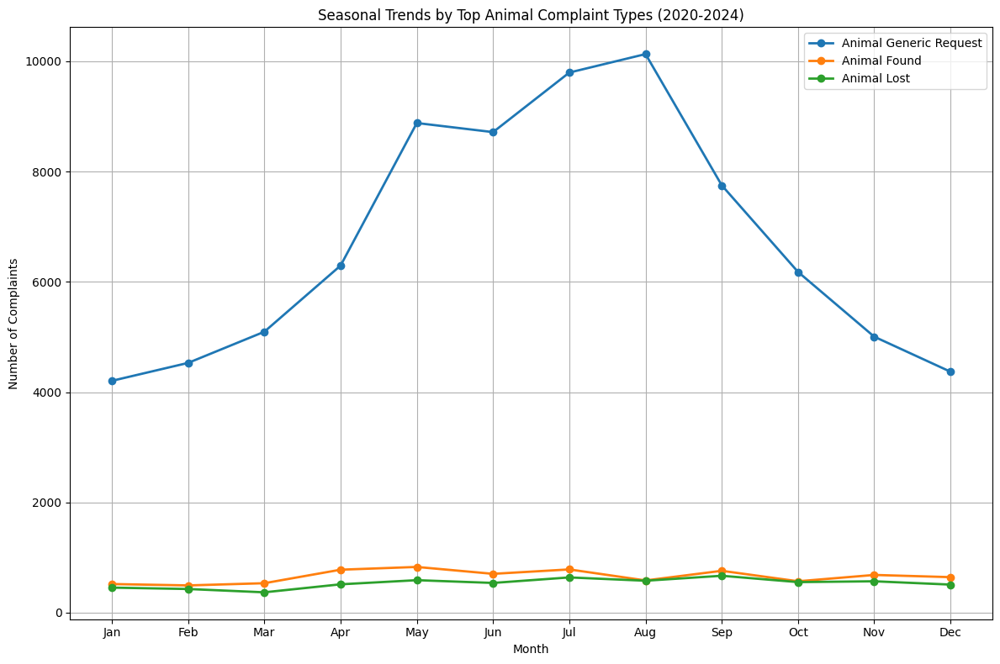

In [14]:
for year, file_path in file_paths.items():
    print(f"\nAnalyzing data for {year}...")

    # Load data
    try:
        data = pd.read_csv(file_path)
        print(f"Successfully loaded {file_path} with {len(data)} records")

        # Filter for Animal Control complaints
        animal_complaints = data[data['subject'] == 'Animal Control'].copy()

        # Add year and month columns
        animal_complaints['Year'] = pd.to_datetime(animal_complaints['open_dt']).dt.year
        animal_complaints['Month'] = pd.to_datetime(animal_complaints['open_dt']).dt.month

        # Store results for this year
        yearly_results[year] = {
            'total_complaints': len(animal_complaints),
            'data': animal_complaints
        }

        # Add to running total
        total_animal_reports += len(animal_complaints)

        # Append to combined dataframe for later analysis
        all_animal_complaints = pd.concat([all_animal_complaints, animal_complaints], ignore_index=True)

        # Print year-specific summary
        print(f"Animal complaints in {year}: {len(animal_complaints)}")

        # Most common animal types for this year (using case_title or reason)
        common_animals = animal_complaints['case_title'].value_counts().head(5)
        print(f"Top 5 most common animal complaints in {year}:")
        print(common_animals)

        # Plot top animals for this year
        plt.figure(figsize=(12, 6))
        common_animals.plot(kind='bar', title=f'Top Animal Complaints in {year}')
        plt.xlabel('Complaint Type')
        plt.ylabel('Number of Complaints')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig(f'animal_complaints_{year}.png')

        # Seasonal analysis for this year
        monthly_data = animal_complaints.groupby('Month').size()
        plt.figure(figsize=(10, 6))
        monthly_data.plot(kind='line', marker='o', title=f'Monthly Animal Complaints in {year}')
        plt.xlabel('Month')
        plt.ylabel('Number of Complaints')
        plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(f'monthly_animal_complaints_{year}.png')

        # Geographic distribution for this year with underlying map
        geo_data = animal_complaints.dropna(subset=['latitude', 'longitude'])
        if len(geo_data) > 0:
            # Convert to GeoDataFrame
            geometry = [Point(xy) for xy in zip(geo_data['longitude'], geo_data['latitude'])]
            gdf = gpd.GeoDataFrame(geo_data, geometry=geometry, crs="EPSG:4326")

            # Plot
            fig, ax = plt.subplots(figsize=(12, 10))
            gdf.plot(ax=ax, alpha=0.5, markersize=5, color='red')

            # Add basemap
            ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)

            plt.title(f'Geographic Distribution of Animal Complaints in {year}')
            plt.tight_layout()
            plt.savefig(f'geo_animal_complaints_{year}.png')

            # Create heatmap with underlying map
            fig, ax = plt.subplots(figsize=(12, 10))

            # Convert to web mercator for better visualization
            gdf_web = gdf.to_crs(epsg=3857)

            # Create heatmap
            heatmap = ax.hexbin(
                gdf_web.geometry.x,
                gdf_web.geometry.y,
                gridsize=50,
                cmap='hot_r',
                alpha=0.7,
                mincnt=1
            )

            # Add basemap
            ctx.add_basemap(ax, crs=gdf_web.crs.to_string(), source=ctx.providers.CartoDB.Positron)

            plt.colorbar(heatmap, label='Complaint Density')
            plt.title(f'Heatmap of Animal Complaints in {year}')
            plt.tight_layout()
            plt.savefig(f'heatmap_animal_complaints_{year}.png')

    except Exception as e:
        print(f"Error processing file for {year}: {e}")

# Overall analysis after processing all files
print("\n--- OVERALL ANALYSIS (2020-2024) ---")
print(f"Total Animal Reports: {total_animal_reports}")

# Yearly trend analysis
yearly_totals = {year: results['total_complaints'] for year, results in yearly_results.items()}
years = list(yearly_totals.keys())
counts = list(yearly_totals.values())

plt.figure(figsize=(10, 6))
plt.bar(years, counts)
plt.title('Animal Complaints Trend (2020-2024)')
plt.xlabel('Year')
plt.ylabel('Number of Complaints')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('yearly_trend.png')

# Calculate trend
if len(years) >= 2:
    slope = np.polyfit(years, counts, 1)[0]
    trend_direction = "increasing" if slope > 0 else "decreasing"
    print(f"Overall trend: {trend_direction} ({slope:.2f} complaints per year)")

# Most common animal types across all years
all_common_animals = all_animal_complaints['case_title'].value_counts().head(10)
print("\nTop 10 Most Common Animal Complaints (2020-2024):")
print(all_common_animals)

plt.figure(figsize=(14, 6))
all_common_animals.plot(kind='bar')
plt.title('Top 10 Most Common Animal Complaints (2020-2024)')
plt.xlabel('Complaint Type')
plt.ylabel('Number of Complaints')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('top_animals_overall.png')

# Analyze by neighborhood
if 'neighborhood' in all_animal_complaints.columns:
    neighborhood_counts = all_animal_complaints['neighborhood'].value_counts().head(10)
    plt.figure(figsize=(14, 6))
    neighborhood_counts.plot(kind='bar')
    plt.title('Top 10 Neighborhoods with Most Animal Complaints (2020-2024)')
    plt.xlabel('Neighborhood')
    plt.ylabel('Number of Complaints')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('neighborhood_complaints.png')

    # Cross-tabulate neighborhood vs complaint type
    top_complaints = all_animal_complaints['case_title'].value_counts().head(5).index
    top_neighborhoods = all_animal_complaints['neighborhood'].value_counts().head(5).index

    cross_tab = pd.crosstab(
        all_animal_complaints['neighborhood'].apply(lambda x: x if x in top_neighborhoods else 'Other'),
        all_animal_complaints['case_title'].apply(lambda x: x if x in top_complaints else 'Other')
    )

    plt.figure(figsize=(12, 8))
    sns.heatmap(cross_tab, annot=True, cmap='YlGnBu', fmt='d')
    plt.title('Animal Complaint Types by Neighborhood')
    plt.tight_layout()
    plt.savefig('neighborhood_complaint_types.png')

# Seasonal trends across all years
all_monthly_data = all_animal_complaints.groupby('Month').size()
plt.figure(figsize=(10, 6))
all_monthly_data.plot(kind='line', marker='o')
plt.title('Seasonal Trends in Animal Complaints (2020-2024)')
plt.xlabel('Month')
plt.ylabel('Number of Complaints')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.savefig('seasonal_trends_overall.png')

# Determine peak season
peak_month = all_monthly_data.idxmax()
peak_month_name = ['January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December'][peak_month-1]
print(f"\nPeak month for animal complaints: {peak_month_name}")

# Geographic analysis across all years with underlying map
geo_data_all = all_animal_complaints.dropna(subset=['latitude', 'longitude'])
if len(geo_data_all) > 0:
    # Convert to GeoDataFrame
    geometry_all = [Point(xy) for xy in zip(geo_data_all['longitude'], geo_data_all['latitude'])]
    gdf_all = gpd.GeoDataFrame(geo_data_all, geometry=geometry_all, crs="EPSG:4326")

    # Convert to web mercator for better visualization
    gdf_all_web = gdf_all.to_crs(epsg=3857)

    # Create heatmap with underlying map
    fig, ax = plt.subplots(figsize=(14, 12))

    # Create heatmap
    heatmap_all = ax.hexbin(
        gdf_all_web.geometry.x,
        gdf_all_web.geometry.y,
        gridsize=75,
        cmap='hot_r',
        alpha=0.7,
        mincnt=1
    )

    # Add basemap
    ctx.add_basemap(ax, crs=gdf_all_web.crs.to_string(), source=ctx.providers.CartoDB.Positron)

    plt.colorbar(heatmap_all, label='Complaint Density')
    plt.title('Heatmap of Animal Complaints (2020-2024)')
    plt.tight_layout()
    plt.savefig('heatmap_animal_complaints_overall.png')

    # Create separate heatmaps for top complaint types
    top_complaints = all_animal_complaints['case_title'].value_counts().head(3).index.tolist()

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    for i, complaint in enumerate(top_complaints):
        complaint_data = geo_data_all[geo_data_all['case_title'] == complaint]

        if len(complaint_data) > 0:
            # Convert to GeoDataFrame
            geometry_complaint = [Point(xy) for xy in zip(complaint_data['longitude'], complaint_data['latitude'])]
            gdf_complaint = gpd.GeoDataFrame(complaint_data, geometry=geometry_complaint, crs="EPSG:4326")

            # Convert to web mercator
            gdf_complaint_web = gdf_complaint.to_crs(epsg=3857)

            # Create heatmap
            heatmap = axes[i].hexbin(
                gdf_complaint_web.geometry.x,
                gdf_complaint_web.geometry.y,
                gridsize=50,
                cmap='hot_r',
                alpha=0.7,
                mincnt=1
            )

            # Add basemap
            ctx.add_basemap(axes[i], crs=gdf_complaint_web.crs.to_string(), source=ctx.providers.CartoDB.Positron)

            axes[i].set_title(f'{complaint}')
            plt.colorbar(heatmap, ax=axes[i], label='Density')

    plt.suptitle('Geographic Distribution by Top 3 Animal Complaint Types (2020-2024)', fontsize=16)
    plt.tight_layout()
    plt.savefig('complaint_type_geography.png')

# Seasonal analysis by complaint type
if len(all_animal_complaints) > 0:
    top_complaints = all_animal_complaints['case_title'].value_counts().head(3).index.tolist()

    plt.figure(figsize=(12, 8))

    for complaint in top_complaints:
        complaint_data = all_animal_complaints[all_animal_complaints['case_title'] == complaint]
        monthly_counts = complaint_data.groupby('Month').size()
        plt.plot(monthly_counts.index, monthly_counts.values, marker='o', linewidth=2, label=complaint)

    plt.title('Seasonal Trends by Top Animal Complaint Types (2020-2024)')
    plt.xlabel('Month')
    plt.ylabel('Number of Complaints')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('seasonal_trends_by_complaint_type.png')